### Network analysis

In this notebook we will explore the class __temporal_nets__ to compute preliminar results using network analysis.

In [1]:
# Adding GDa to path
import sys
sys.path.insert(1, '/home/vinicius/storage1/projects/GrayData-Analysis')

# GDa
from   GDa.temporal_network              import temporal_network
from   xfrites.conn.conn_coh             import conn_coherence_wav
from   GDa.session                       import session
from   GDa.util                          import smooth
from   frites.utils                      import parallel_func


from   GDa.graphics.plot_raster          import plot_nodes_raster_all_bands 
from   GDa.graphics.plot_coherence_dists import plot_pooled_coherence_dists,\
                                                plot_pooled_coherence_dists_per_stage,\
                                                plot_pooled_coherence_dists_per_stim
from   GDa.graphics.plot_adjacency       import plot_adjacency 
from   GDa.net.layerwise                 import *
from   GDa.net.null_models               import *
from   GDa.net.temporal                  import *


import seaborn                           as       sns
import numpy                             as       np
import xarray                            as       xr
import matplotlib.pyplot                 as       plt
import scipy.signal
import time
import os
import h5py
from   tqdm                              import tqdm
from   joblib                            import Parallel, delayed
from   scipy                             import stats

In [2]:
# Bands names
band_names  = [r'band 1', r'band 2', r'band 3', r'band 4', r'band 5']
stages      = ['baseline', 'cue', 'delay', 'match']

### Loading session

In [3]:
# Parameters to read the data
idx      = 3 
nses     = 1
nmonkey  = 0
align_to = 'cue'

dirs = { 'rawdata':'/home/vinicius/storage1/projects/GrayData-Analysis/GrayLab/',
         'results':'Results/',
         'monkey' :['lucy', 'ethyl'],
         'session':'session01',
         'date'   :[['141014', '141015', '141205', '150128', '150211', '150304'], []] }

In [4]:
#  Instantiating session
ses   = session(raw_path = dirs['rawdata'], monkey = dirs['monkey'][nmonkey], date = dirs['date'][nmonkey][idx],
                session = nses, slvr_msmod = False, align_to = align_to, evt_dt = [-0.65, 3.00])
# Load data
ses.read_from_mat()

### Coherence computation

In [5]:
# Defining parameters
f_start, f_end, n_freqs, sfreq = .1, 80, 50, ses.data.attrs['fsample']
freqs = np.linspace(f_start, f_end, n_freqs, endpoint=True)
delta = 15 # Downsampling factor
mode  = 'morlet' # ("morlet", "mt_1", "mt_2")
if mode in ["morlet", "mt_1"]:
    foi   = np.array([
            [0.1, 6.],
            [6., 14.],
            [14., 26.],
            [26., 42.],
            [42., 80.]
                ])
    n_cycles     = freqs/2
    mt_bandwidth = None
    decim_at='tfd'
elif mode == "mt_2":
    foi   = np.array([
            [0.1, 6.],
            [6., 14.],
            [14., 26.],
            [26., 42.],
            [42., 80.]
                ])
    freqs = foi.mean(axis=1)
    W     = np.ceil( foi[:,1]-foi[:,0] )   # Bandwidth
    foi   = None     
    n_cycles     = np.array([3, 5, 9, 12, 16])
    mt_bandwidth = np.array([2, 4, 4.28, 5.647, 9.65])
    decim_at     = 'coh'

In [ ]:
''' 
kw = dict(
    freqs=freqs, times=ses.data.time, roi=ses.data.roi, foi=foi, n_jobs=-1,
    sfreq=sfreq, mode=mode, decim_at=decim_at, n_cycles=n_cycles, decim=delta,
    sm_times=300, sm_freqs=1, block_size=2
)

# compute the coherence
coh = conn_coherence_wav(ses.data.values.astype(np.float32), **kw)
'''

In [ ]:
'''
path_st = os.path.join('data', 
                       dirs['monkey'][nmonkey], 
                       dirs['date'][nmonkey][idx], 
                       'session01', 'super_tensor.h5')

if os.path.isfile(path_st):
    os.system(f'rm {path_st}')

hf = h5py.File(path_st, 'w')

hf.create_dataset('coherence', data=coh.transpose("roi", "trials", "freqs", "times"))
hf.create_dataset('freqs',     data=freqs)
hf.create_dataset('roi',       data=np.array( coh.roi.values, dtype='S' ) )
hf.create_dataset('tarray',    data=coh.times.values)
hf.create_dataset('bands',     data=foi)
[hf.create_dataset('info/'+k,  data=ses.data.attrs[k]) for k in ses.data.attrs.keys()]
hf.close()

del coh
'''

### Instantiating the temporal network

When instantiated, the temporal network object will load the recording info for the monkey, date, and session specified as well as the super tensor; The trial type and the behavioral response can also be specified.

The super-tensor has dimensions [Number of pairs, Number of frequency bands, Number of trials, Time]. For Lucy the frequency bands analysed are:

- band $1$  = [0.1,6]  Hz;
- band $2$  = [6,14]   Hz;
- band $3$  = [14,26]  Hz;
- band $4$  = [26,42]  Hz;
- band $5$  = [42,80]  Hz;

The __temporal_network__ class can also be instantiated by setting threshold as __True__ this will automatically threshold the super-tensor (computed for all trial types independent on how the trial type parameter was set).

In [6]:
# Default threshold
kw = dict(q=0.80, keep_weights=False)

In [8]:
# Instantiating a temporal network object without thresholding the data
net =  temporal_network(data_raw_path='../GrayLab/', 
                        tensor_raw_path='../Results', monkey=dirs['monkey'][nmonkey], 
                        session=1, date='150128', trial_type=[1],
                        behavioral_response=[1], wt=(30,30), drop_trials_after=True,
                        relative=True, verbose=True, **kw)

Computing coherence thresholds


100%|██████████| 5/5 [00:47<00:00,  9.48s/it]


In [9]:
net.convert_to_adjacency()
d_eu = net.super_tensor.attrs['d_eu']
net.create_stage_masks(flatten=True)

### Visualizing the super tensor

#### Binary super-tensor

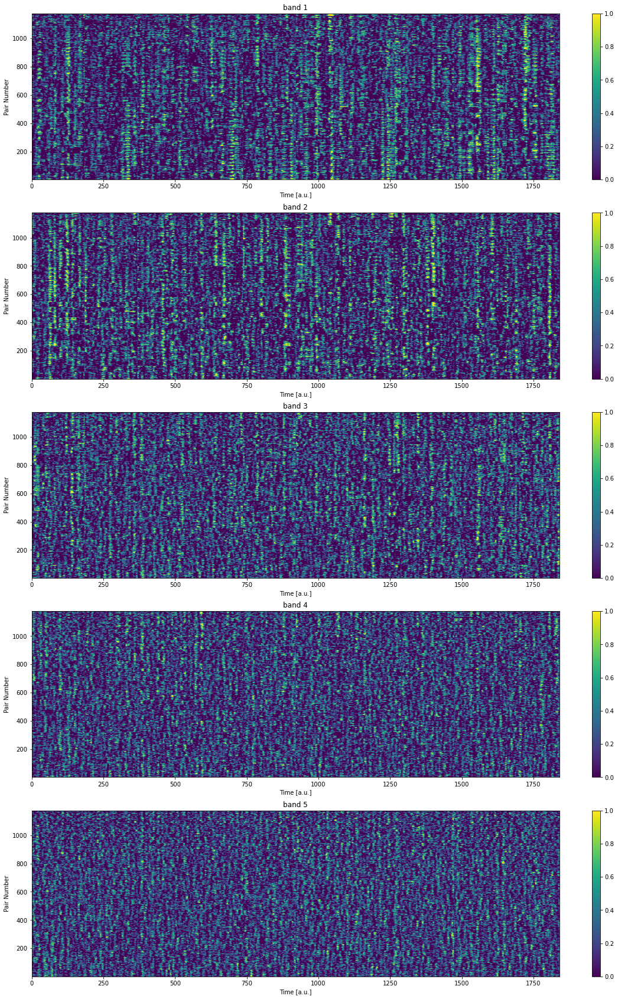

In [10]:
plt.figure(figsize=(20,30))
for i in range(len(band_names)):
    plt.subplot(len(band_names), 1, i+1)
    plt.imshow(net.super_tensor[:,i,:10,:].stack(observations=('trials','time')), 
               aspect = 'auto', cmap = 'viridis', origin = 'lower', 
               extent = [0, 10*len(net.tarray), 1, net.session_info['nP']], vmin = 0, vmax = 1)
    plt.colorbar()
    plt.ylabel('Pair Number')
    plt.xlabel('Time [a.u.]')
    plt.title(band_names[i])

#### Plotting average for trials with similar delay durations

In [12]:
win_delay=[
           [1,1.1],
           [1.1, 1.2], 
           [1.2, 1.3], 
           [1.3, 1.4], 
           [1.4, 1.6]
          ]

avg_st = net.get_averaged_st(win_delay=win_delay)

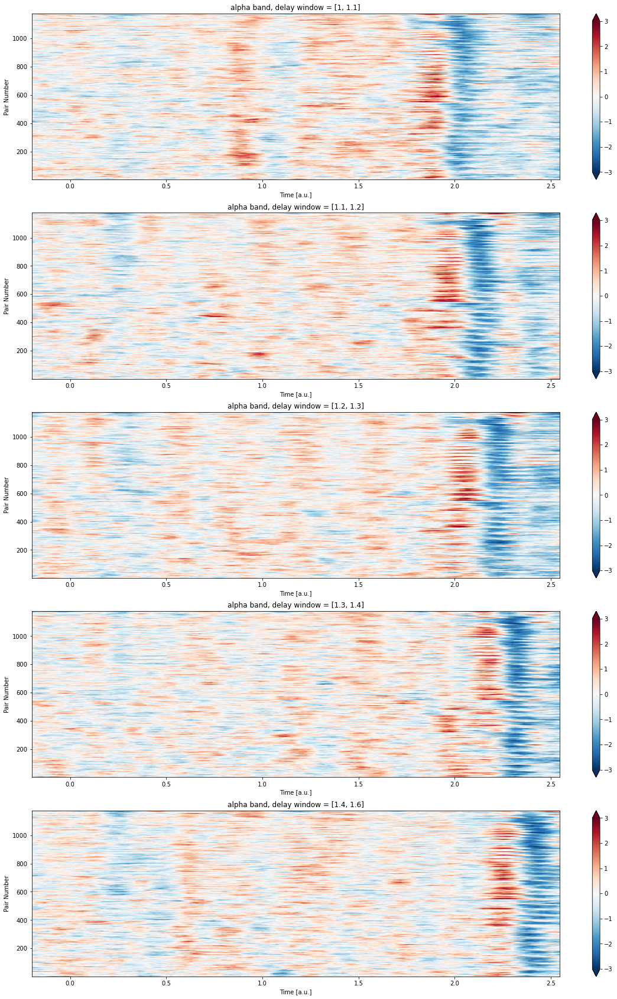

In [13]:
plt.figure(figsize=(20,30))
aux  = scipy.stats.zscore(net.super_tensor.mean(dim='trials'), axis=-1)
band = 1
for i in range(len(avg_st)):
    plt.subplot(len(avg_st), 1, i+1)
    aux = ( avg_st[i][:,band,:]-avg_st[i][:,band,:].mean(dim='time') ) / avg_st[i][:,band,:].std(dim='time')
    plt.imshow(aux, 
               aspect = 'auto', cmap = 'RdBu_r', origin = 'lower',
               extent = [net.tarray[0], net.tarray[-1], 1, net.session_info['nP']], 
               vmin=-3, vmax=3)
    plt.colorbar(extend='both')
    plt.ylabel('Pair Number')
    plt.xlabel('Time [a.u.]')
    plt.title(f'alpha band, delay window = {win_delay[i]}')
plt.savefig('img/avg_st_delays.png', dpi=300)

### Null models and temporal correlations

#### Creating null models for each band and randomized edges and time frames.

In [23]:
# Shuffling frames
A_s = np.empty_like(net.A)
# Randomizing edges
A_r = np.empty_like(net.A)

In [24]:
for t in tqdm( range(net.super_tensor.sizes['trials']) ):
    for i in range(len(net.bands)):
        A_s[:,:,i,t,:] = shuffle_frames(net.A[:,:,i,t,:].values)

100%|██████████| 540/540 [00:13<00:00, 40.55it/s]


In [25]:
def randomize_edges_per_band(A, n_rewires, n_jobs):
    assert isinstance(A, xr.DataArray)
    assert isinstance(n_rewires, int)
    assert "bands" in A.dims
    
    n_bands = A.sizes['bands']
    
    def _for_band(band):
        return randomize_edges(A.isel(bands=band), n_rewires=n_rewires)
    
    # define the function to compute in parallel
    parallel, p_fun = parallel_func(
        _for_band, n_jobs=n_jobs, verbose=True,
        total=n_bands)
    # compute the single trial coherence
    A_r = parallel(p_fun(band) for band in range(n_bands))
    A_r = xr.concat(A_r, dim="bands")
    A_r = A_r.transpose("roi_1","roi_2","bands","trials","time")
    return A_r

A_r = randomize_edges_per_band(net.A, 10000, 4)

  0%|          |  : 0/5 [00:00<?,       ?it/s]

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   5 out of   5 | elapsed:  9.5min finished


Let's compare a random adjacency matrix with its randomized version.

Text(0.5, 1.0, 'Randomized, band 1 observation 13')

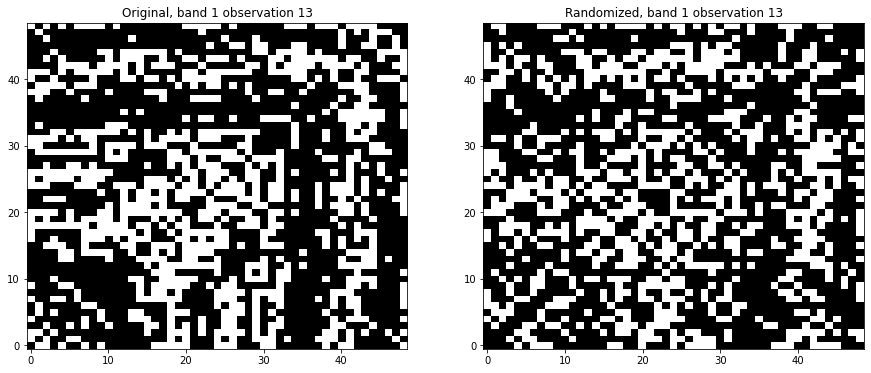

In [26]:
plt.figure(figsize=(15,6))
plt.subplot(1,2,1)
t_rnd = np.random.randint(0, net.super_tensor.shape[-1])
plt.imshow(net.A[:,:,1,10,t_rnd], aspect='auto', cmap='gray', origin='lower')
plt.title(r'Original, band 1 observation ' + str(t_rnd))
plt.subplot(1,2,2)
plt.imshow(A_r[:,:,1,10,t_rnd], aspect='auto', cmap='gray', origin='lower')
plt.title(r'Randomized, band 1 observation ' + str(t_rnd))

/home/vinicius/projects/GrayData-Analysis/GDa/net/temporal.py:21: RuntimeWarning: invalid value encountered in true_divide
  Ci  = np.nansum(( num / den ), axis=1) / (A.shape[-1] - 1)


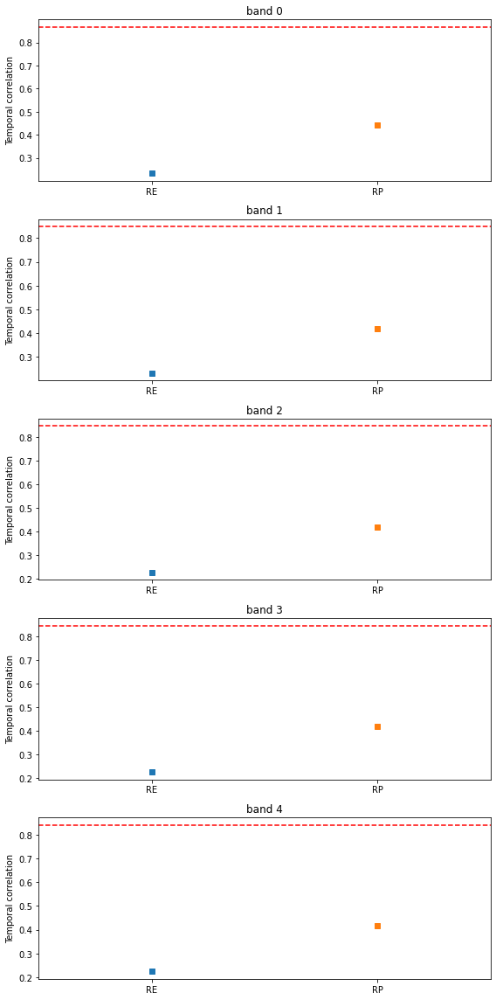

In [17]:
plt.figure(figsize=(8,16))
for i in range(len(net.bands)):
    # Original network
    CC_on = compute_temporal_correlation(
        #net.A[:,:,i,:,:].values.reshape(net.A.shape[0],net.A.shape[1],net.A.shape[3]*net.A.shape[4])
        net.A[:,:,i,:,:].stack(observations=("trials", "time")).values
    )
    # Randomize on edges
    CC_re = compute_temporal_correlation(
        A_r[:,:,i,:,:].stack(observations=("trials","time"))
    )
    # Randomize on time
    CC_rt = compute_temporal_correlation(
        A_s[:,:,i,:,:].reshape(A_s.shape[0],A_s.shape[1],A_s.shape[3]*A_s.shape[4])
    )
    # Plotting
    plt.subplot(5,1,i+1)
    plt.plot(1, CC_re, marker='s')
    plt.plot(3, CC_rt, marker='s')
    plt.hlines(CC_on, 0, 4, linestyle='--', color = 'r')
    plt.xlim([0,4])
    plt.ylabel('Temporal correlation')
    plt.xticks([1,3], ['RE', 'RP'])
    plt.title(f'band {i}')
plt.tight_layout()

### Jaccard index

In [13]:
J = {}
for i in tqdm( range(len(net.bands)) ): 
    J[str(i)] = jaccard_index(net.A[:,:,i,:,:].values, mirror=False)

  0%|          | 0/5 [00:00<?, ?it/s]/home/vinicius/projects/GrayData-Analysis/GDa/net/temporal.py:57: RuntimeWarning: invalid value encountered in true_divide
  J = num/den
100%|██████████| 5/5 [00:10<00:00,  2.15s/it]


100%|██████████| 5/5 [00:00<00:00,  9.79it/s]


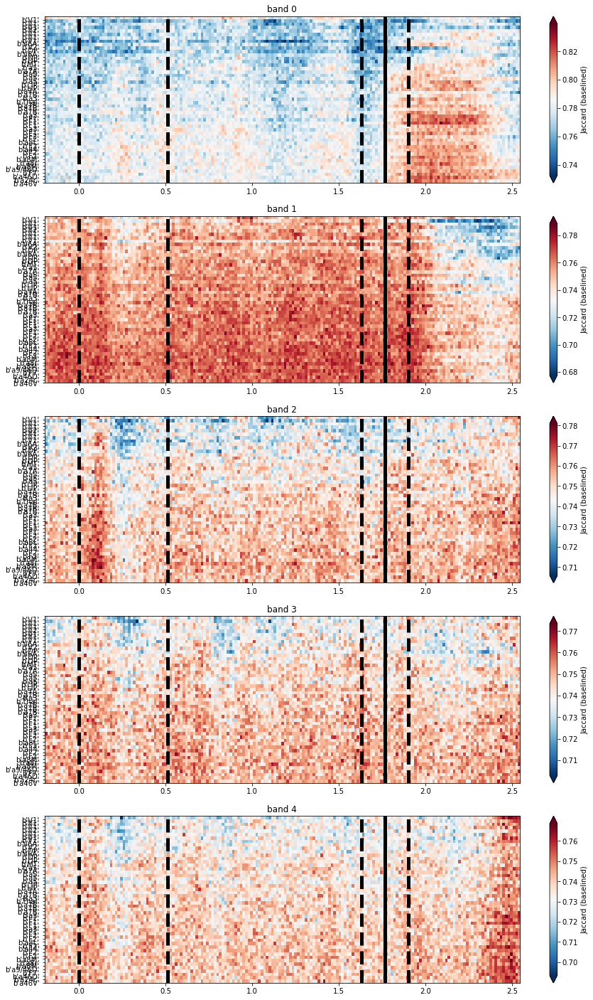

In [19]:
plt.figure(figsize=(15,25))
for i in tqdm( range(len(net.bands)) ):  
    plt.subplot(5,1,i+1)
    aux = np.nansum(J[str(i)], axis=1)/J[str(i)].shape[1]
    #aux = (aux-aux.mean(-1)[:,None])/aux.std(-1)[:,None]
    plt.imshow(aux, aspect = 'auto', 
               cmap = 'RdBu_r', origin = 'lower',
               extent = [net.tarray[0],net.tarray[-1],0,49])
    plt.colorbar(extend='both', label='Jaccard (baselined)')
    plt.vlines(0, 0, 49, linestyle='--', linewidth = 5, color = 'k')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   0, 49, linestyle='--', linewidth = 5, color = 'k')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       0, 49, linestyle='-', linewidth = 5, color = 'k')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       0, 49, linestyle='--', linewidth = 5, color = 'k')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       0, 49, linestyle='--', linewidth = 5, color = 'k')
    plt.yticks(range(49), ses.data.roi.values)
    plt.title(f'band {i}')

100%|██████████| 5/5 [01:15<00:00, 15.07s/it]


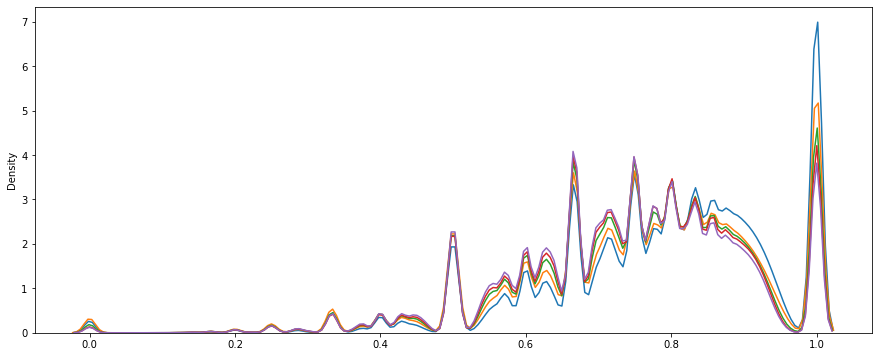

In [15]:
plt.figure(figsize=(15,6))
for i in tqdm( range(len(net.bands)) ):  
    aux = J[str(i)][~np.isnan(J[str(i)])].flatten(order='C')
    sns.kdeplot(data=aux, shade=False)

### Jaccard index - Randomized Edges

In [16]:
J_r = {}
for i in tqdm( range(len(net.bands)) ): 
    J_r[str(i)] = jaccard_index(A_r[:,:,i,:,:].values, mirror=False)

  0%|          | 0/5 [00:00<?, ?it/s]/home/vinicius/projects/GrayData-Analysis/GDa/net/temporal.py:57: RuntimeWarning: invalid value encountered in true_divide
  J = num/den
100%|██████████| 5/5 [00:10<00:00,  2.14s/it]


100%|██████████| 5/5 [00:00<00:00,  7.75it/s]


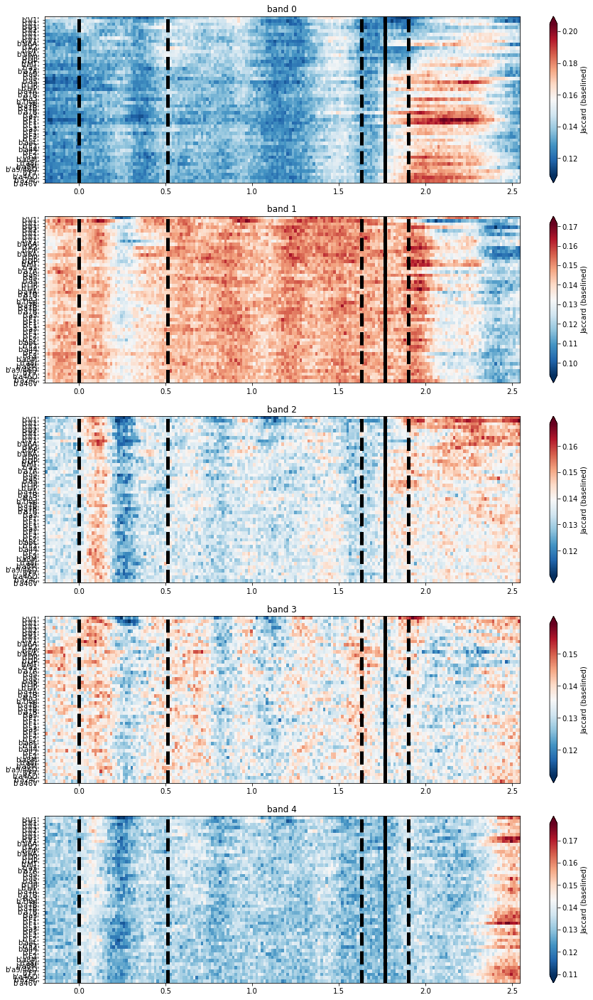

In [20]:
plt.figure(figsize=(15,25))
for i in tqdm( range(len(net.bands)) ):  
    plt.subplot(5,1,i+1)
    aux = np.nansum(J_r[str(i)], axis=1)/J_r[str(i)].shape[1]
    #aux = (aux-aux.mean(-1)[:,None])/aux.std(-1)[:,None]
    plt.imshow(aux, aspect = 'auto', 
               cmap = 'RdBu_r', origin = 'lower',
               extent = [net.tarray[0],net.tarray[-1],0,49])
    plt.colorbar(extend='both', label='Jaccard (baselined)')
    plt.vlines(0, 0, 49, linestyle='--', linewidth = 5, color = 'k')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   0, 49, linestyle='--', linewidth = 5, color = 'k')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       0, 49, linestyle='-', linewidth = 5, color = 'k')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       0, 49, linestyle='--', linewidth = 5, color = 'k')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       0, 49, linestyle='--', linewidth = 5, color = 'k')
    plt.yticks(range(49), ses.data.roi.values)
    plt.title(f'band {i}')

100%|██████████| 5/5 [01:14<00:00, 14.82s/it]


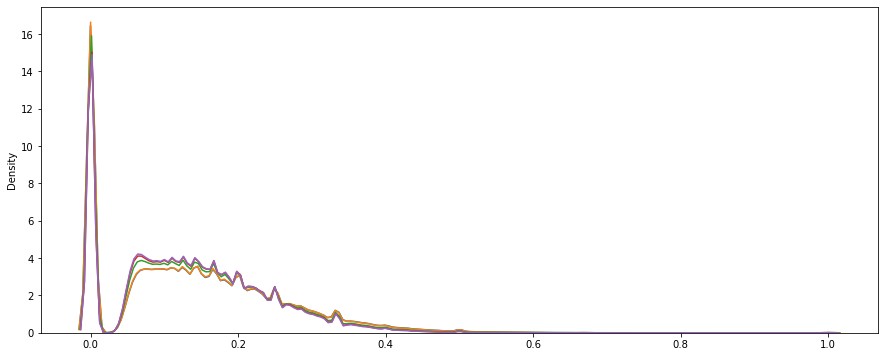

In [18]:
plt.figure(figsize=(15,6))
for i in tqdm( range(len(net.bands)) ):  
    aux = J_r[str(i)][~np.isnan(J_r[str(i)])].flatten(order='C')
    sns.kdeplot(data=aux, shade=False)

### Network measures

We can use the filtered super tensor to compute all sorts of networkd measures. Let's start by analysing the network measurements averaged over trials.

#### Node degree

In [14]:
##################################################################################
# NODES' DEGREE
##################################################################################
degree = []
for i in tqdm( range(len(net.bands)) ): 
    degree  += [compute_nodes_degree(net.A[:,:,i,:,:].values, mirror=False)]
degree = xr.concat( degree, dim='bands')

100%|██████████| 5/5 [00:01<00:00,  4.36it/s]


100%|██████████| 5/5 [00:00<00:00, 10.20it/s]


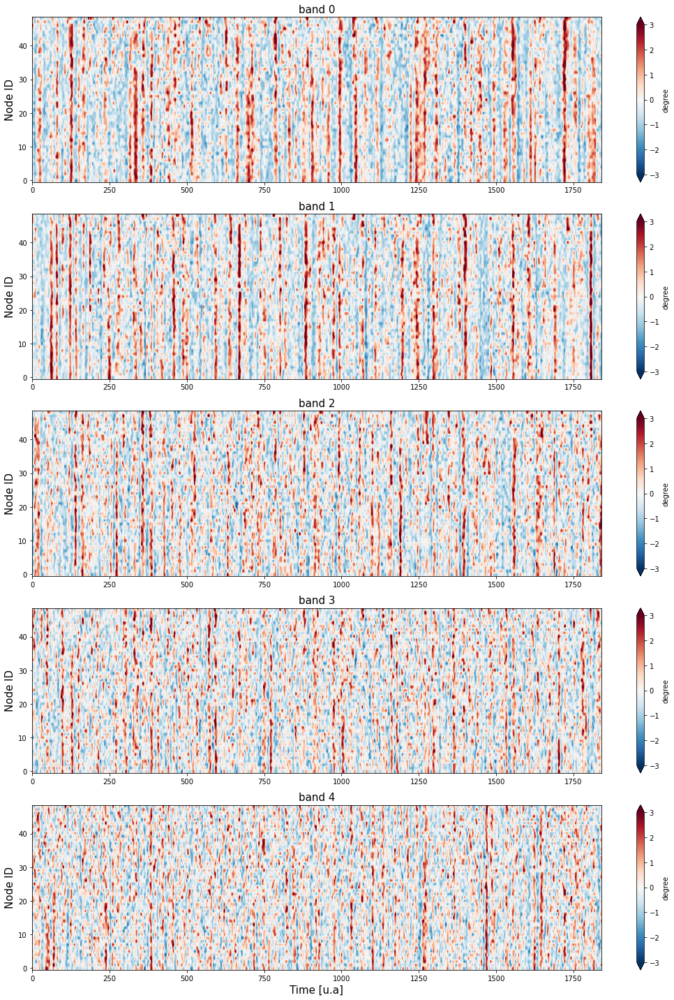

In [15]:
plt.figure(figsize=(15,20))
for i in tqdm( range(len(net.bands)) ):
    plt.subplot(5,1,i+1)
    aux = degree.isel(bands=i)
    aux = (aux-aux.mean(dim="time"))/aux.std(dim="time")
    aux = aux.stack(observations=("trials","time"))
    plt.imshow(aux[...,:10*len(net.tarray)], vmin=-3, vmax=3,
               aspect='auto', cmap='RdBu_r', origin='lower')
    plt.colorbar(label='degree', extend='both')
    plt.title(f'band {i}', fontsize=15)
    if i == 4: plt.xlabel('Time [u.a]', fontsize=15)
    plt.ylabel('Node ID', fontsize=15)
plt.tight_layout()

It is hard to compare both the weighted and binary version of the measure by means of the raster plot, however we can measure the summed strength/degree of the network for a more general view. Let's plot the the summed degree avareged on trials for each frequency band:

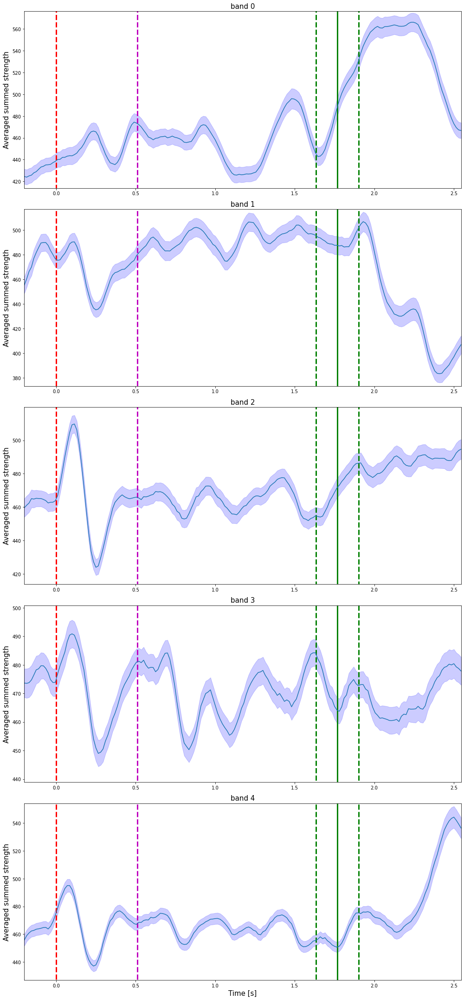

In [16]:
plt.figure(figsize=(14,30))
c = ['b', 'r']
for j in range( len(net.bands) ):
    plt.subplot(len(net.bands),1,j+1)
    # Summed degree for all nodes
    s_d   = degree.isel(bands=j).sum(dim="roi")
    # Average over trials
    s_d_m = s_d.mean(dim="trials") 
    # Std over trials
    s_d_e = s_d.std(dim="trials") / (s_d.sizes["trials"]**0.5)
    plt.plot(net.tarray, s_d_m, label = 'b')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color='b')
    #
    plt.title(f'band {j}', fontsize=15)
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-10, s_d_m.max()+10])
    plt.vlines(0, s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed strength', fontsize=15)
    if j==4: plt.xlabel('Time [s]', fontsize=15)
plt.tight_layout()

We can also measure the same quantities for the randomized version of the adjacency matrices:

In [33]:
degree_r = []
for i in tqdm( range(len(net.bands)) ): 
    degree_r  += [compute_nodes_degree(A_r[:,:,i,:,:], mirror=False)]
degree_r = xr.concat( degree_r, dim='bands')

100%|██████████| 5/5 [00:01<00:00,  4.06it/s]


Next we plot the average summed degree for the original and randomized networks

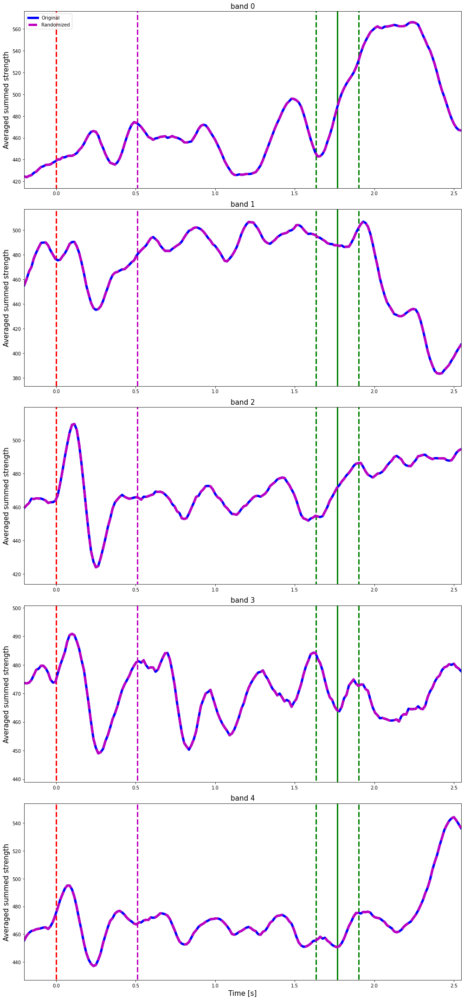

In [36]:
plt.figure(figsize=(14,30))
for j in range( len(net.bands) ):
    plt.subplot(5,1,j+1)
    # Original
    s_d   = degree.isel(bands=j).sum(dim="roi")
    s_d_m = s_d.mean(dim="trials")
    #
    plt.plot(net.tarray, s_d_m, 'b', lw=5)
    # Random
    s_d   = degree_r.isel(bands=j).sum(dim="roi")
    s_d_m = s_d.mean(dim="trials")
    #
    plt.plot(net.tarray, s_d_m, 'm--', lw=5)
    if j == 0:
        plt.legend(['Original', 'Randomized'])
    plt.title(f'band {j}', fontsize=15)
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-10, s_d_m.max()+10])
    plt.vlines(0, s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed strength', fontsize=15)
    if j==4: plt.xlabel('Time [s]', fontsize=15)
plt.tight_layout()

#### Coreness 

In [17]:
##################################################################################
# NODES' CORENESS
##################################################################################
coreness = []
for i in tqdm( range(len(net.bands)) ): 
    coreness  += [compute_nodes_coreness(net.A[:,:,i,:,:], is_weighted=False, verbose=False)]
coreness = xr.concat( coreness, dim='bands')

100%|██████████| 5/5 [01:13<00:00, 14.64s/it]


100%|██████████| 5/5 [00:00<00:00, 10.61it/s]


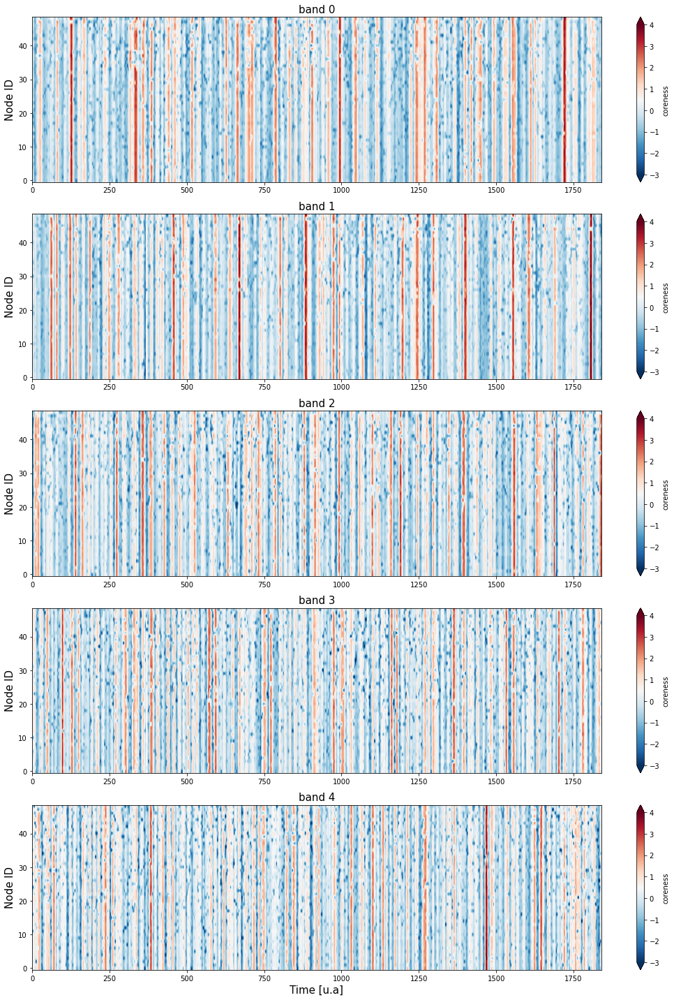

In [18]:
plt.figure(figsize=(15,20))
for i in tqdm( range(len(net.bands)) ):
    plt.subplot(5,1,i+1)
    aux = coreness.isel(bands=i)
    aux = (aux-aux.mean(dim="time"))/aux.std(dim="time")
    aux = aux.stack(observations=("trials","time"))
    plt.imshow(aux[...,:10*len(net.tarray)], vmin=-3, vmax=4,
               aspect='auto', cmap='RdBu_r', origin='lower')
    plt.colorbar(label='coreness', extend='both')
    plt.title(f'band {i}', fontsize=15)
    if i == 4: plt.xlabel('Time [u.a]', fontsize=15)
    plt.ylabel('Node ID', fontsize=15)
plt.tight_layout()

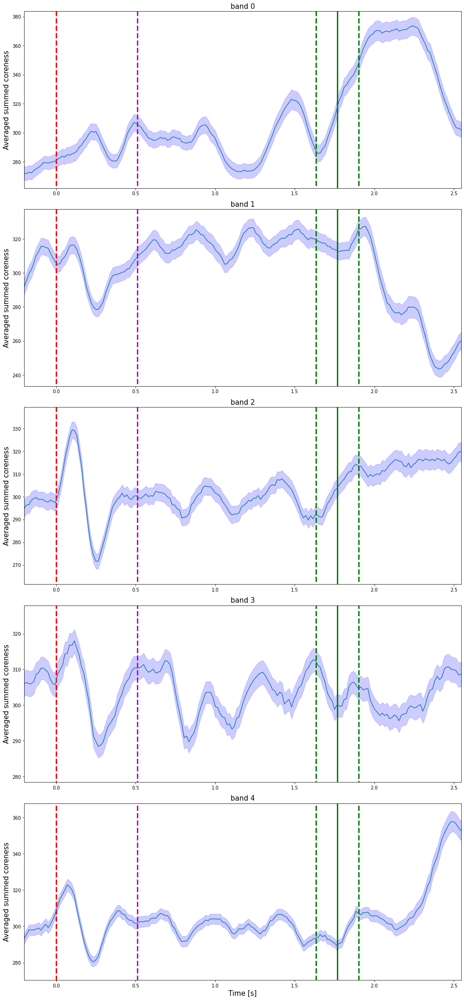

In [19]:
plt.figure(figsize=(14,30))
c = ['b', 'r']
for j in range( len(net.bands) ):
    plt.subplot(len(net.bands),1,j+1)
    # Summed degree for all nodes
    s_d   = coreness.isel(bands=j).sum(dim="roi")
    # Average over trials
    s_d_m = s_d.mean(dim="trials") 
    # Std over trials
    s_d_e = s_d.std(dim="trials") / (s_d.sizes["trials"]**0.5)
    plt.plot(net.tarray, s_d_m, label = 'b')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color='b')
    #
    plt.title(f'band {j}', fontsize=15)
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-10, s_d_m.max()+10])
    plt.vlines(0, s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed coreness', fontsize=15)
    if j==4: plt.xlabel('Time [s]', fontsize=15)
plt.tight_layout()

#### Coreness - Excess

In [40]:
coreness_r = []
for i in tqdm( range(len(net.bands)) ): 
    coreness_r  += [compute_nodes_coreness(A_r[:,:,i,:,:], is_weighted=False, verbose=False)]
coreness_r = xr.concat( coreness_r, dim='bands')

100%|██████████| 5/5 [01:02<00:00, 12.50s/it]


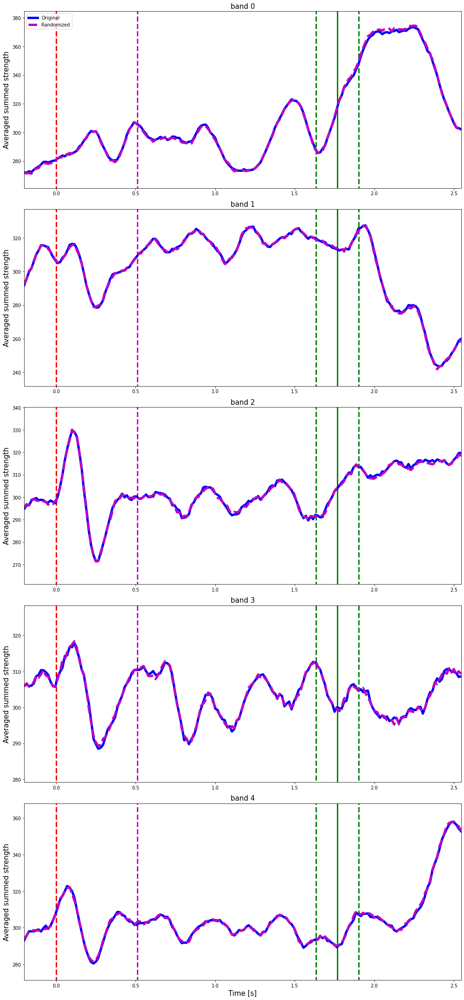

In [44]:
plt.figure(figsize=(14,30))
for j in range( len(net.bands) ):
    plt.subplot(5,1,j+1)
    # Original
    s_d   = coreness.isel(bands=j).sum(dim="roi")
    s_d_m = s_d.mean(dim="trials")
    #
    plt.plot(net.tarray, s_d_m, 'b', lw=5)
    # Random
    s_d   = coreness_r.isel(bands=j).sum(dim="roi")
    s_d_m = s_d.mean(dim="trials")
    #
    plt.plot(net.tarray, s_d_m, 'm--', lw=5)
    if j == 0:
        plt.legend(['Original', 'Randomized'])
    plt.title(f'band {j}', fontsize=15)
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-10, s_d_m.max()+10])
    plt.vlines(0, s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed strength', fontsize=15)
    if j==4: plt.xlabel('Time [s]', fontsize=15)
plt.tight_layout()

#### Clustering

In [25]:
##################################################################################
# NODES' CLUSTERING
##################################################################################
clustering = []
for i in tqdm( range(len(net.bands)) ): 
    clustering  += [compute_nodes_clustering(net.A[:,:,i,:,:], is_weighted=True, verbose=False)]
clustering = xr.concat( clustering, dim='bands')

100%|██████████| 5/5 [01:36<00:00, 19.37s/it]


In [26]:
clustering

<xarray.DataArray (bands: 5, roi: 49, trials: 540, time: 184)>
array([[[[0.35753232, 0.33477973, 0.14754998, ..., 0.        ,
          0.14854254, 0.30257786],
         [0.15391838, 0.2445558 , 0.21810178, ..., 0.        ,
          0.        , 0.09802857],
         [0.19618773, 0.32904747, 0.3278859 , ..., 0.09952485,
          0.09783589, 0.14306814],
         ...,
         [0.09749224, 0.09847659, 0.26539409, ..., 0.14181544,
          0.17820816, 0.16772638],
         [0.38041377, 0.31852215, 0.28346577, ..., 0.19245637,
          0.09891698, 0.11250474],
         [0.39215029, 0.38665638, 0.31074106, ..., 0.67801711,
          0.73408692, 0.74913688]],

        [[0.38901863, 0.3953125 , 0.36096787, ..., 0.        ,
          0.3344066 , 0.32440742],
         [0.07094883, 0.0631071 , 0.06253464, ..., 0.28352713,
          0.23314637, 0.19817043],
         [0.33694386, 0.13241823, 0.09146402, ..., 0.13866903,
          0.10610215, 0.07058231],
...
         [0.16710641, 0.        , 0.19970986, ..., 0.18101101,
          0.18141042, 0.10980826],
         [0.10195212, 0.1989257 , 0.14449122, ..., 0.334735  ,
          0.30680906, 0.19229796],
         [0.33287571, 0.32086487, 0.19434189, ..., 0.19932732,
          0.14373603, 0.09567562]],

        [[0.14032693, 0.18913011, 0.26517022, ..., 0.06748435,
          0.1908459 , 0.19101991],
         [0.1862297 , 0.1548997 , 0.19147084, ..., 0.09928406,
          0.10013601, 0.04762567],
         [0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0.        ],
         ...,
         [0.33828997, 0.        , 0.        , ..., 0.36073   ,
          0.24170171, 0.10579523],
         [0.16891748, 0.14373858, 0.04806215, ..., 0.2924865 ,
          0.19017015, 0.13277299],
         [0.28476467, 0.26787572, 0.25608997, ..., 0.2094337 ,
          0.19139693, 0.13211736]]]])
Coordinates:
  * roi      (roi) uint8 1 4 9 13 16 17 22 23 ... 210 219 221 224 242 248 250
  * time     (time) float64 -0.2 -0.185 -0.17 -0.155 ... 2.5 2.515 2.53 2.545
  * trials   (trials) int64 1 2 3 9 12 13 14 15 ... 875 877 879 880 883 884 886
Dimensions without coordinates: bands

100%|██████████| 5/5 [00:00<00:00, 10.08it/s]


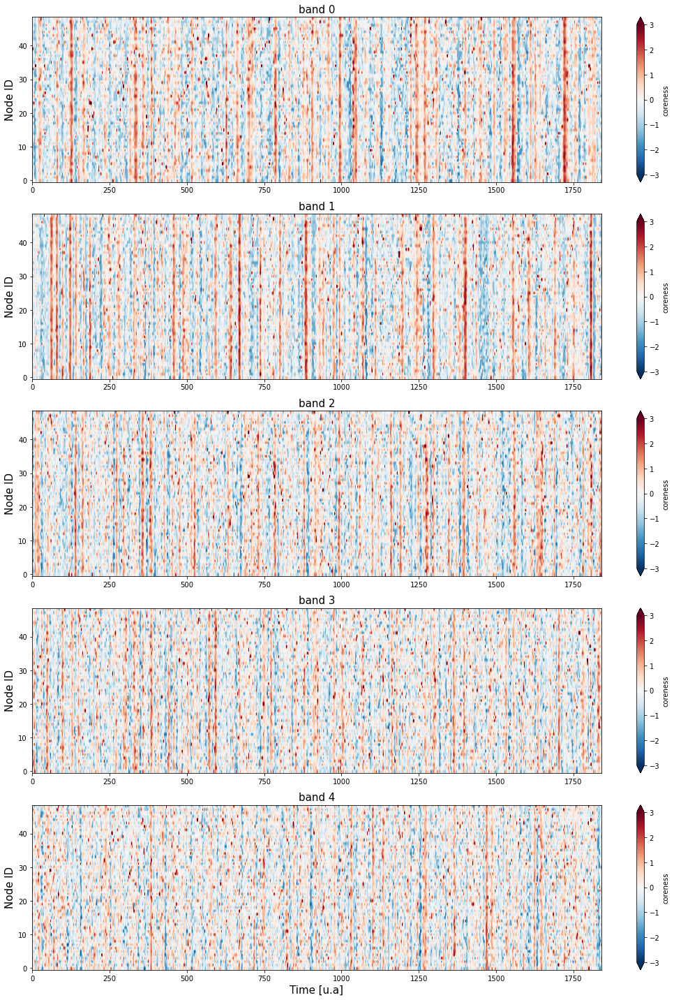

In [27]:
plt.figure(figsize=(15,20))
for i in tqdm( range(len(net.bands)) ):
    plt.subplot(5,1,i+1)
    aux = clustering.isel(bands=i)
    aux = (aux-aux.mean(dim="time"))/aux.std(dim="time")
    aux = aux.stack(observations=("trials","time"))
    plt.imshow(aux[...,:10*len(net.tarray)], vmin=-3, vmax=3,
               aspect='auto', cmap='RdBu_r', origin='lower')
    plt.colorbar(label='coreness', extend='both')
    plt.title(f'band {i}', fontsize=15)
    if i == 4: plt.xlabel('Time [u.a]', fontsize=15)
    plt.ylabel('Node ID', fontsize=15)
plt.tight_layout()

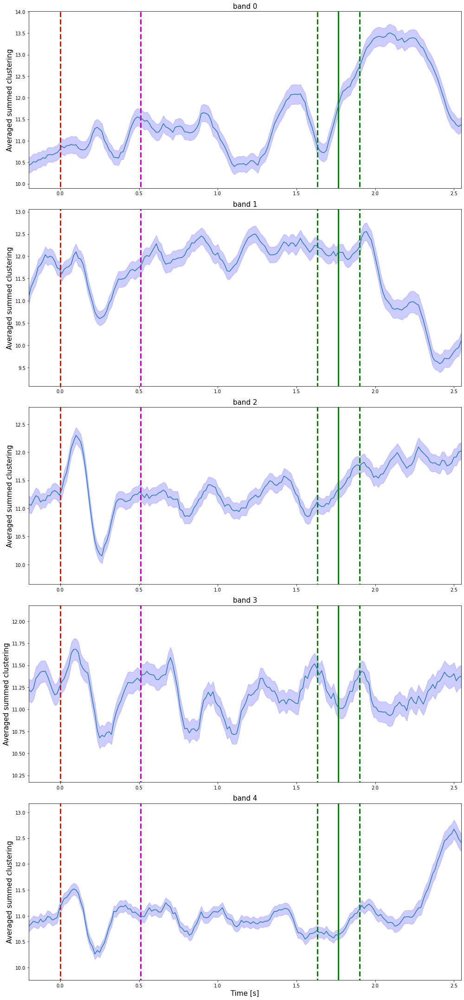

In [28]:
plt.figure(figsize=(14,30))
c = ['b', 'r']
for j in range( len(net.bands) ):
    plt.subplot(len(net.bands),1,j+1)
    # Summed degree for all nodes
    s_d   = clustering.isel(bands=j).sum(dim="roi")
    # Average over trials
    s_d_m = s_d.mean(dim="trials") 
    # Std over trials
    s_d_e = s_d.std(dim="trials") / (s_d.sizes["trials"]**0.5)
    plt.plot(net.tarray, s_d_m, label = 'b')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color='b')
    #
    plt.title(f'band {j}', fontsize=15)
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-.5, s_d_m.max()+.5])
    plt.vlines(0, s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed clustering', fontsize=15)
    if j==4: plt.xlabel('Time [s]', fontsize=15)
plt.tight_layout()

#### Clustering - Excess

In [48]:
clustering_r = []
for i in tqdm( range(len(net.bands)) ): 
    clustering_r  += [compute_nodes_clustering(A_r.isel(bands=i), is_weighted=False, verbose=False)]
clustering_r = xr.concat( clustering_r, dim='bands')

100%|██████████| 5/5 [01:08<00:00, 13.70s/it]


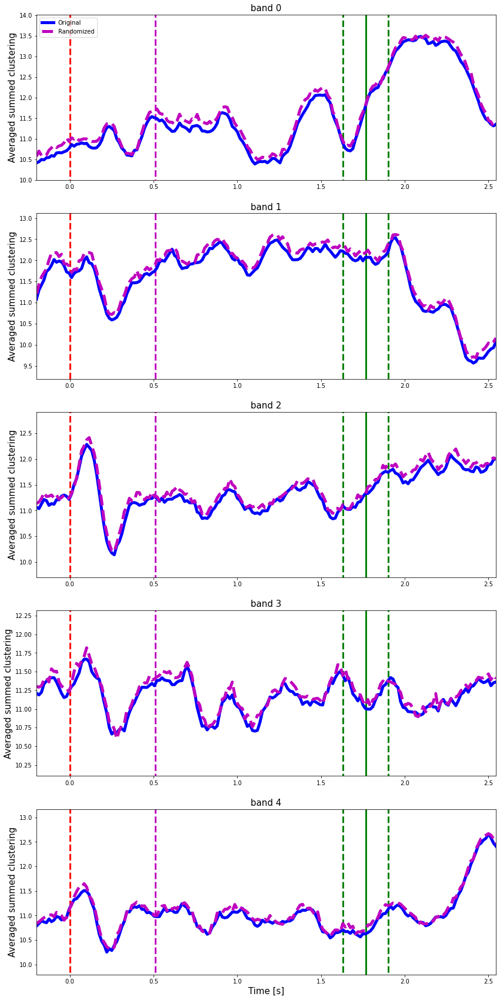

In [49]:
plt.figure(figsize=(14,30))
for j in range( len(net.bands) ):
    plt.subplot(5,1,j+1)
    # Original
    s_d   = clustering.isel(bands=j).sum(dim="roi")
    s_d_m = s_d.mean(dim="trials")
    #
    plt.plot(net.tarray, s_d_m, 'b', lw=5)
    # Random
    s_d   = clustering_r.isel(bands=j).sum(dim="roi")
    s_d_m = s_d.mean(dim="trials")
    #
    plt.plot(net.tarray, s_d_m, 'm--', lw=5)
    if j == 0:
        plt.legend(['Original', 'Randomized'])
    plt.title(f'band {j}', fontsize=15)
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-.5, s_d_m.max()+.5])
    plt.vlines(0, s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed clustering', fontsize=15)
    if j==4: plt.xlabel('Time [s]', fontsize=15)

#### Modularity

In [20]:
##################################################################################
# NETWORK MODULARITY
##################################################################################
modularity = []
for i in tqdm( range(len(net.bands)) ): 
    modularity  += [compute_network_modularity(net.A.isel(bands=i), is_weighted=False, verbose=False)]
modularity = xr.concat( modularity, dim='bands')

100%|██████████| 5/5 [04:58<00:00, 59.71s/it]


100%|██████████| 5/5 [00:00<00:00, 28.15it/s]


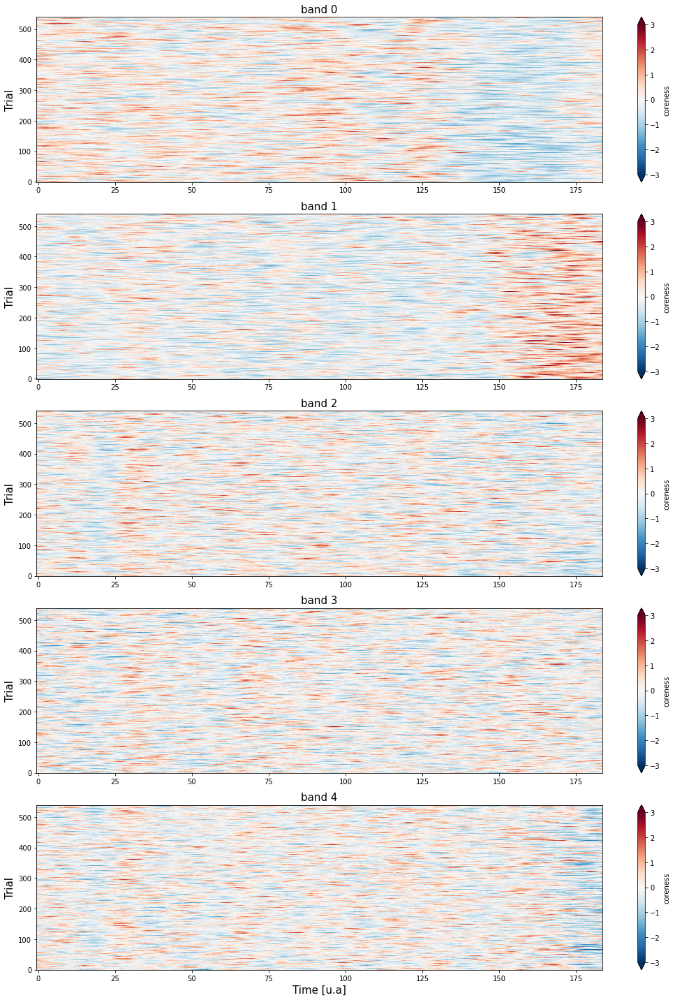

In [21]:
plt.figure(figsize=(15,20))
for i in tqdm( range(len(net.bands)) ):
    plt.subplot(5,1,i+1)
    aux = modularity.isel(bands=i)
    aux = (aux-aux.mean(dim="time"))/aux.std(dim="time")
    plt.imshow(aux, vmin=-3, vmax=3,
               aspect='auto', cmap='RdBu_r', origin='lower')
    plt.colorbar(label='coreness', extend='both')
    plt.title(f'band {i}', fontsize=15)
    if i == 4: plt.xlabel('Time [u.a]', fontsize=15)
    plt.ylabel('Trial', fontsize=15)
plt.tight_layout()

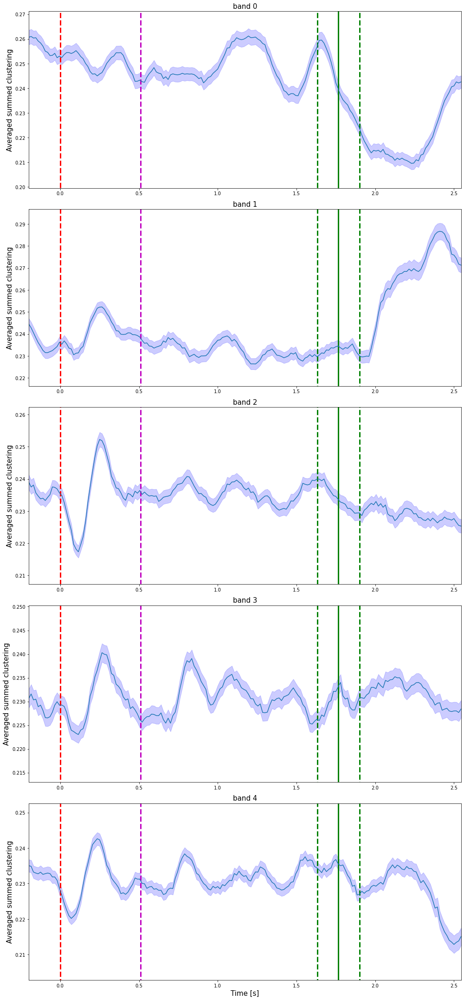

In [31]:
plt.figure(figsize=(14,30))
c = ['b', 'r']
for j in range( len(net.bands) ):
    plt.subplot(len(net.bands),1,j+1)
    # Summed degree for all nodes
    s_d   = modularity.isel(bands=j)
    # Average over trials
    s_d_m = s_d.mean(dim="trials") 
    # Std over trials
    s_d_e = s_d.std(dim="trials") / (s_d.sizes["trials"]**0.5)
    plt.plot(net.tarray, s_d_m, label = 'b')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color='b')
    #
    plt.title(f'band {j}', fontsize=15)
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-0.01, s_d_m.max()+0.01])
    plt.vlines(0, s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed clustering', fontsize=15)
    if j==4: plt.xlabel('Time [s]', fontsize=15)
plt.tight_layout()

####  Modularity - Chance level

In [59]:
modularity_r = []
for i in tqdm( range(len(net.bands)) ): 
    modularity_r  += [compute_network_modularity(A_r[:,:,i,:,:], is_weighted=False, verbose=False)]
modularity_r = xr.concat( modularity_r, dim='bands')

100%|██████████| 5/5 [04:21<00:00, 52.26s/it]


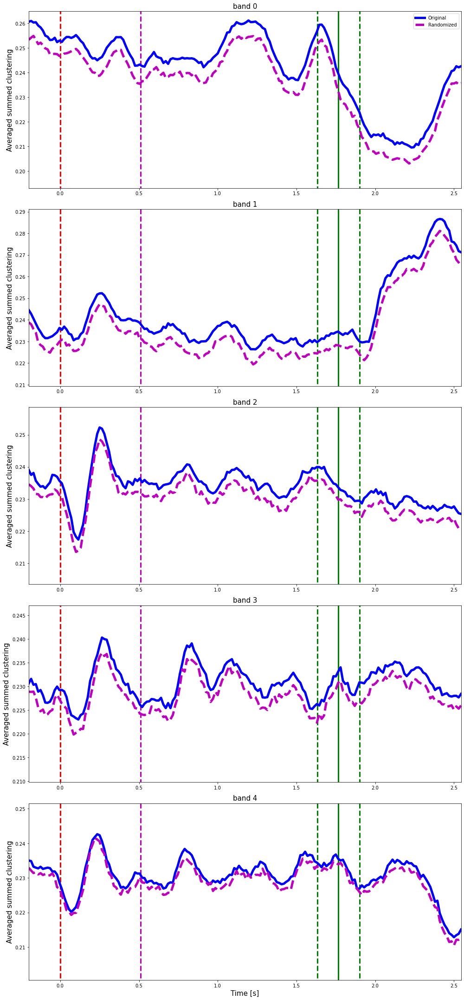

In [60]:
plt.figure(figsize=(14,30))
for j in range( len(net.bands) ):
    plt.subplot(5,1,j+1)
    # Original
    s_d   = modularity.isel(bands=j)
    s_d_m = s_d.mean(dim="trials")
    #
    plt.plot(net.tarray, s_d_m, 'b', lw=5)
    # Random
    s_d   = modularity_r.isel(bands=j)
    s_d_m = s_d.mean(dim="trials")
    #
    plt.plot(net.tarray, s_d_m, 'm--', lw=5)
    if j == 0:
        plt.legend(['Original', 'Randomized'])
    plt.title(f'band {j}', fontsize=15)
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-0.01, s_d_m.max()+0.01])
    plt.vlines(0, s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed clustering', fontsize=15)
    if j==4: plt.xlabel('Time [s]', fontsize=15)
plt.tight_layout()

### Temporal dynamics

#### Windowed Allegiance 

In [37]:
win_args  = dict(slwin_len=.15, slwin_step=0.02)
kw_leiden = dict(seed=0)
T = []
for band in range(len(net.bands)):
    T += [windowed_allegiance_matrix(net.A.isel(bands=band), times=net.tarray, is_weighted=True, verbose=True, 
                               kw_leiden=kw_leiden, win_args=win_args, n_jobs=-1)]
T = xr.concat( T, dim='bands')

Defining temporal windows
    Definition of sliding windows (len=0.15, start=-0.19999999999999962, stop=2.545000000000003, step=0.02)
    130 windows defined


  0%|          |  : 0/540 [00:00<?,       ?it/s]

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed:   21.9s
[Parallel(n_jobs=-1)]: Done 370 tasks      | elapsed:   46.1s
[Parallel(n_jobs=-1)]: Done 540 out of 540 | elapsed:   59.8s finished
Defining temporal windows
    Definition of sliding windows (len=0.15, start=-0.19999999999999962, stop=2.545000000000003, step=0.02)
    130 windows defined


  0%|          |  : 0/540 [00:00<?,       ?it/s]

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed:   12.4s
[Parallel(n_jobs=-1)]: Done 370 tasks      | elapsed:   37.2s
[Parallel(n_jobs=-1)]: Done 540 out of 540 | elapsed:   50.6s finished
Defining temporal windows
    Definition of sliding windows (len=0.15, start=-0.19999999999999962, stop=2.545000000000003, step=0.02)
    130 windows defined


  0%|          |  : 0/540 [00:00<?,       ?it/s]

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed:   12.9s
[Parallel(n_jobs=-1)]: Done 370 tasks      | elapsed:   37.0s
[Parallel(n_jobs=-1)]: Done 540 out of 540 | elapsed:   50.5s finished
Defining temporal windows
    Definition of sliding windows (len=0.15, start=-0.19999999999999962, stop=2.545000000000003, step=0.02)
    130 windows defined


  0%|          |  : 0/540 [00:00<?,       ?it/s]

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed:   12.7s
[Parallel(n_jobs=-1)]: Done 370 tasks      | elapsed:   37.3s
[Parallel(n_jobs=-1)]: Done 540 out of 540 | elapsed:   51.9s finished
Defining temporal windows
    Definition of sliding windows (len=0.15, start=-0.19999999999999962, stop=2.545000000000003, step=0.02)
    130 windows defined


  0%|          |  : 0/540 [00:00<?,       ?it/s]

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed:   12.4s
[Parallel(n_jobs=-1)]: Done 370 tasks      | elapsed:   37.1s
[Parallel(n_jobs=-1)]: Done 540 out of 540 | elapsed:   50.9s finished


In [38]:
M = []
for band in tqdm( range(len(net.bands) ) ):
    M += [compute_network_modularity(T.isel(bands=band), kw_leiden=dict(seed=0, n_iterations=2), is_weighted=True, verbose=False)]
M = xr.concat(M, dim='bands')

100%|██████████| 5/5 [04:04<00:00, 48.86s/it]


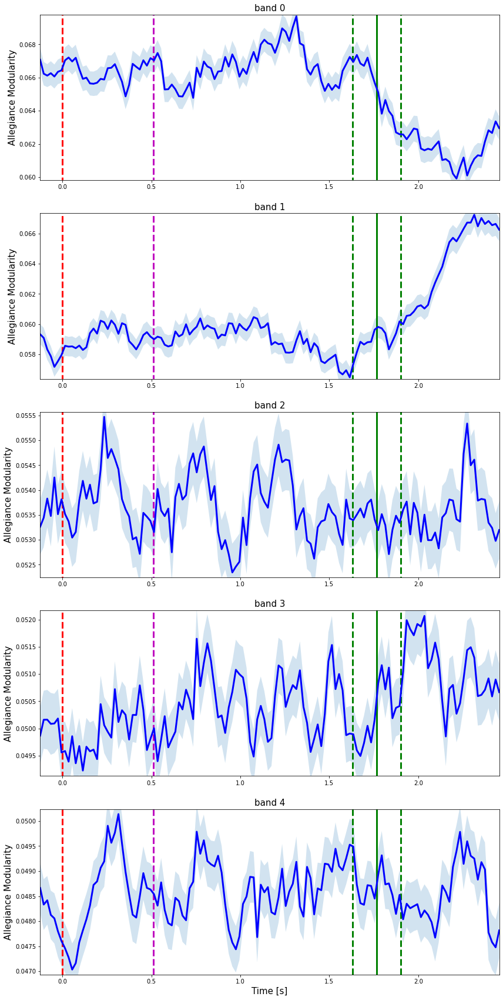

In [39]:
plt.figure(figsize=(14,30))
for j in range( len(net.bands) ):
    plt.subplot(5,1,j+1)
    # Original
    M_mean   = M.isel(bands=j).mean(dim="trials")
    M_std    = M.isel(bands=j).std(dim="trials") / np.sqrt( M.sizes["trials"] )
    plt.plot(M.time, M_mean, 'b', lw=3)
    plt.fill_between(M.time, M_mean-M_std, M_std+M_mean, alpha=0.2)
    plt.title(f'band {j}', fontsize=15)
    plt.xlim([M.time[0],M.time[-1]])
    plt.ylim([M_mean.min()-0.0001, M_mean.max()+0.0001])
    plt.vlines(0, M_mean.min()-100, M_mean.max()+100, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   M_mean.min()-100, M_mean.max()+100, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       M_mean.min()-100, M_mean.max()+100, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       M_mean.min()-100, M_mean.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       M_mean.min()-100, M_mean.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Allegiance Modularity', fontsize=15)
    if j==4: plt.xlabel('Time [s]', fontsize=15)

In [70]:
times = T.time.values
for band in range(len(net.bands)):
    for time in range(len(times)):
        plt.figure(figsize=(12,10))
        plt.subplot2grid((4,3), (0,0), rowspan=3, colspan=3)
        T.isel(trials=0,time=time,bands=band).plot.imshow(x="roi_1",y="roi_2",cmap='viridis', vmin=0, vmax=1)
        plt.subplot2grid((4,3), (3,0), rowspan=1, colspan=3)
        plt.plot(M.time[:time], M.isel(trials=0, bands=band,time=slice(0,time)))
        plt.ylim([M.isel(trials=0, bands=band).min(),M.isel(trials=0, bands=band).max()])
        plt.savefig(f'img/band_{band}_time_{np.round(time,2)}.png', dpi=150)
        plt.close()

#### Windowed Allegiance - Randomized

In [27]:
win_args  = dict(slwin_len=.15, slwin_step=0.02)
kw_leiden = dict(seed=0)
T_r = []
for band in range(len(net.bands)):
    T_r += [windowed_allegiance_matrix(A_r.isel(bands=band), times=net.tarray, is_weighted=False, verbose=True, 
                               kw_leiden=kw_leiden, win_args=win_args, n_jobs=-1)]
T_r = xr.concat( T_r, dim='bands')

Defining temporal windows
    Definition of sliding windows (len=0.15, start=-0.19999999999999962, stop=2.545000000000003, step=0.02)
    130 windows defined


  0%|          |  : 0/540 [00:00<?,       ?it/s]

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed:   22.7s
[Parallel(n_jobs=-1)]: Done 370 tasks      | elapsed:   46.9s
[Parallel(n_jobs=-1)]: Done 540 out of 540 | elapsed:  1.0min finished
Defining temporal windows
    Definition of sliding windows (len=0.15, start=-0.19999999999999962, stop=2.545000000000003, step=0.02)
    130 windows defined


  0%|          |  : 0/540 [00:00<?,       ?it/s]

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed:   12.1s
[Parallel(n_jobs=-1)]: Done 370 tasks      | elapsed:   36.1s
[Parallel(n_jobs=-1)]: Done 540 out of 540 | elapsed:   49.4s finished
Defining temporal windows
    Definition of sliding windows (len=0.15, start=-0.19999999999999962, stop=2.545000000000003, step=0.02)
    130 windows defined


  0%|          |  : 0/540 [00:00<?,       ?it/s]

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed:   11.8s
[Parallel(n_jobs=-1)]: Done 370 tasks      | elapsed:   36.0s
[Parallel(n_jobs=-1)]: Done 540 out of 540 | elapsed:   49.2s finished
Defining temporal windows
    Definition of sliding windows (len=0.15, start=-0.19999999999999962, stop=2.545000000000003, step=0.02)
    130 windows defined


  0%|          |  : 0/540 [00:00<?,       ?it/s]

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed:   11.8s
[Parallel(n_jobs=-1)]: Done 370 tasks      | elapsed:   36.4s
[Parallel(n_jobs=-1)]: Done 540 out of 540 | elapsed:   49.6s finished
Defining temporal windows
    Definition of sliding windows (len=0.15, start=-0.19999999999999962, stop=2.545000000000003, step=0.02)
    130 windows defined


  0%|          |  : 0/540 [00:00<?,       ?it/s]

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed:   11.9s
[Parallel(n_jobs=-1)]: Done 370 tasks      | elapsed:   35.9s
[Parallel(n_jobs=-1)]: Done 540 out of 540 | elapsed:   49.6s finished


In [ ]:
M_r = []
for band in tqdm( range(len(net.bands) ) ):
    M_r += [compute_network_modularity(T_r.isel(bands=band), kw_leiden=dict(seed=0, n_iterations=2), is_weighted=True, verbose=False)]
M_r = xr.concat(M_r, dim='bands')

In [ ]:
plt.figure(figsize=(14,30))
for j in range( len(net.bands) ):
    plt.subplot(5,1,j+1)
    # ORIGINAL
    M_exc    = (M-M_r)/M_r
    M_mean   = M_exc.isel(bands=j).mean(dim="trials")
    M_std    = M_exc.isel(bands=j).std(dim="trials") / np.sqrt( M_exc.sizes["trials"] )
    plt.plot(M.time, M_mean, 'b', lw=3)
    plt.fill_between(M.time, M_mean-M_std, M_std+M_mean, color='b',alpha=0.2)
    plt.title(f'band {j}', fontsize=15)
    plt.xlim([M_r.time[0],M_r.time[-1]])
    plt.ylim([M_mean.min()-0.0001, M_mean.max()+0.0001])
    plt.vlines(0, M_mean.min()-100, M_mean.max()+100, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   M_mean.min()-100, M_mean.max()+100, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       M_mean.min()-100, M_mean.max()+100, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       M_mean.min()-100, M_mean.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       M_mean.min()-100, M_mean.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Allegiance Modularity', fontsize=15)
    if j==4: plt.xlabel('Time [s]', fontsize=15)

In [ ]:
times = T.time.values
for band in range(len(net.bands)):
    for time in range(len(times)):
        plt.figure(figsize=(12,10))
        T_r.isel(trials=0,time=time,bands=band).plot.imshow(x="roi_1",y="roi_2",cmap='viridis', vmin=0, vmax=1)
        plt.savefig(f'img/rand_band_{band}_time_{np.round(time,2)}.png', dpi=150)
        plt.close()

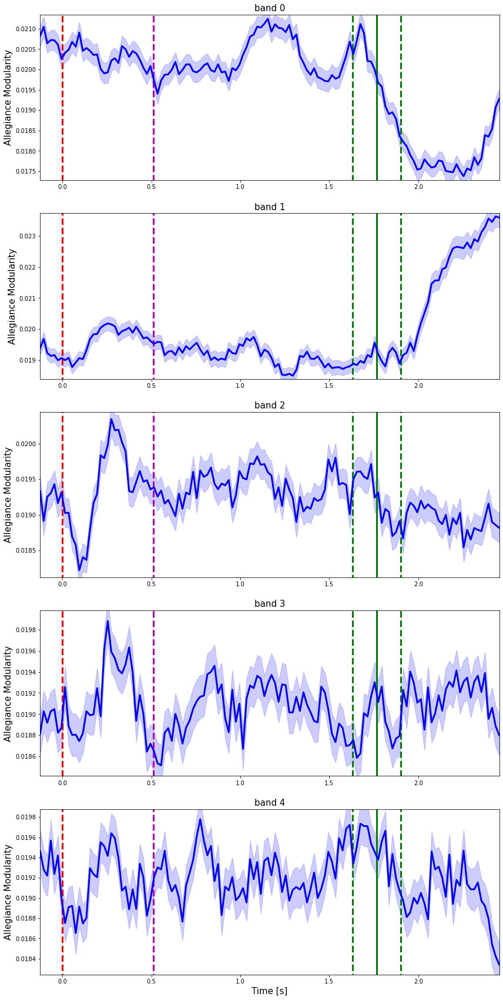

In [39]:
plt.figure(figsize=(14,30))
for j in range( len(net.bands) ):
    plt.subplot(5,1,j+1)
    # ORIGINAL
    M_mean   = M_r.isel(bands=j).mean(dim="trials")
    M_std    = M_r.isel(bands=j).std(dim="trials") / np.sqrt( M_r.sizes["trials"] )
    plt.plot(M.time, M_mean, 'b', lw=3)
    plt.fill_between(M.time, M_mean-M_std, M_std+M_mean, color='b',alpha=0.2)
    plt.title(f'band {j}', fontsize=15)
    plt.xlim([M_r.time[0],M_r.time[-1]])
    plt.ylim([M_mean.min()-0.0001, M_mean.max()+0.0001])
    plt.vlines(0, M_mean.min()-100, M_mean.max()+100, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   M_mean.min()-100, M_mean.max()+100, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       M_mean.min()-100, M_mean.max()+100, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       M_mean.min()-100, M_mean.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       M_mean.min()-100, M_mean.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Allegiance Modularity', fontsize=15)
    if j==4: plt.xlabel('Time [s]', fontsize=15)

#### Windowed Allegiance - Original-Randomized

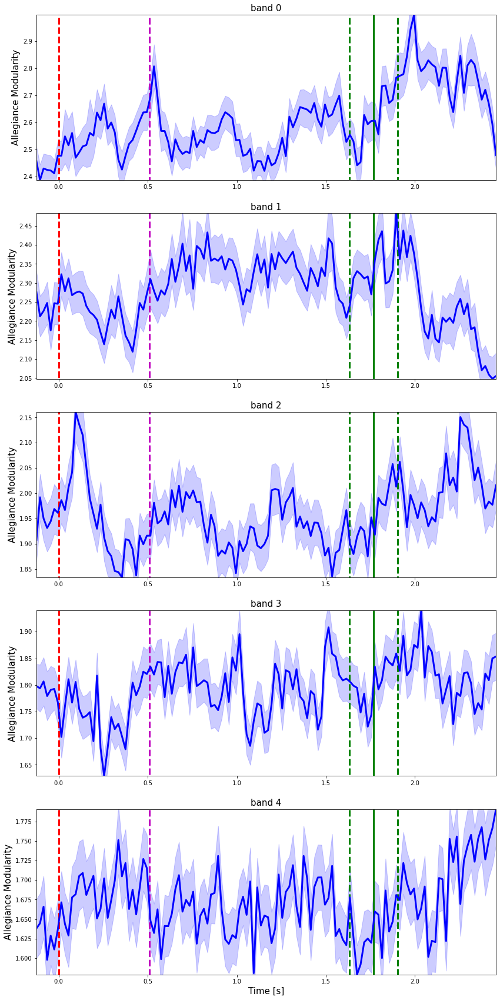

In [38]:
plt.figure(figsize=(14,30))
for j in range( len(net.bands) ):
    plt.subplot(5,1,j+1)
    # ORIGINAL
    M_exc    = (M-M_r)/M_r
    M_mean   = M_exc.isel(bands=j).mean(dim="trials")
    M_std    = M_exc.isel(bands=j).std(dim="trials") / np.sqrt( M_exc.sizes["trials"] )
    plt.plot(M.time, M_mean, 'b', lw=3)
    plt.fill_between(M.time, M_mean-M_std, M_std+M_mean, color='b',alpha=0.2)
    plt.title(f'band {j}', fontsize=15)
    plt.xlim([M_r.time[0],M_r.time[-1]])
    plt.ylim([M_mean.min()-0.0001, M_mean.max()+0.0001])
    plt.vlines(0, M_mean.min()-100, M_mean.max()+100, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   M_mean.min()-100, M_mean.max()+100, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       M_mean.min()-100, M_mean.max()+100, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       M_mean.min()-100, M_mean.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       M_mean.min()-100, M_mean.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Allegiance Modularity', fontsize=15)
    if j==4: plt.xlabel('Time [s]', fontsize=15)

################################################################################################################################################################

In [40]:
import networkx as nx

In [41]:
n, k = 100, 10
seed = 0
p_rw = np.linspace(0,1,200)
is_weighted = False

A = []
for i, p in enumerate(p_rw):
    G   = nx.watts_strogatz_graph(n, k, p, seed=None)
    A  += [nx.adjacency_matrix(G).toarray()]
A = np.stack(A, axis=0)
A = xr.DataArray(A[:,:,:,np.newaxis], dims=("time","roi_1","roi_2","trials") )
A = A.transpose("roi_1","roi_2","trials","time")
# Weigths
if is_weighted:
    W = np.random.uniform(0, 1, size=A.shape)
    W = xr.DataArray( W, dims=("roi_1","roi_2","trials","time") )
    A = W*A

In [42]:
win_args  = dict(slwin_len=10, slwin_step=1)
kw_leiden = dict(seed=0)
T = windowed_allegiance_matrix(A, times=A.time.values, is_weighted=is_weighted, verbose=False, 
                               kw_leiden=kw_leiden, win_args=win_args, n_jobs=1)

Defining temporal windows
    Definition of sliding windows (len=10, start=0, stop=199, step=1)
    189 windows defined


  0%|          |  : 0/1 [00:00<?,       ?it/s]

In [43]:
M = compute_network_modularity(T, kw_leiden=dict(seed=0), is_weighted=True, verbose=False)

Text(0, 0.5, 'Allegiance modularity')

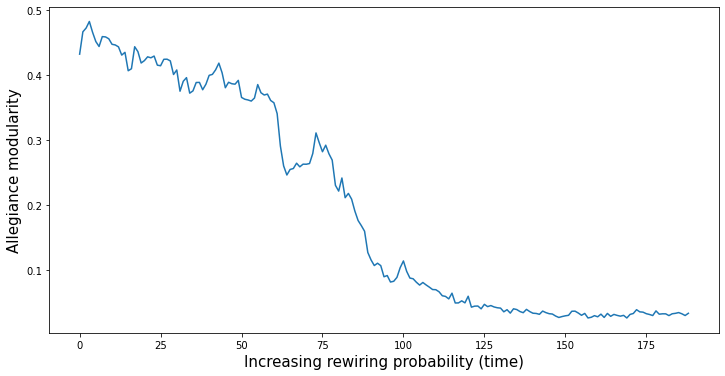

In [44]:
plt.figure(figsize=(12,6))
plt.plot(M.values.squeeze())
plt.xlabel('Increasing rewiring probability (time)', fontsize=15)
plt.ylabel('Allegiance modularity', fontsize=15)

In [11]:
times = T.time.values
for time in range(len(times)):
    plt.figure(figsize=(12,10))
    T.isel(trials=0,time=time).plot.imshow(x="roi_1",y="roi_2",cmap='viridis', vmin=0, vmax=1)
    plt.savefig(f'img/{time}.png', dpi=150)
    plt.close()

### Testes

################################################################################################################################################################

In [50]:
n, k = 100, 10
p_rw = np.array( [1]*50 + [0]*15 + [1]*50 )
seed = 0
is_weighted = True

A = []
for i, p in enumerate(p_rw):
    G   = nx.watts_strogatz_graph(n, k, p, seed=None)
    A  += [nx.adjacency_matrix(G).toarray()]
A = np.stack(A, axis=0)
A = xr.DataArray(A[:,:,:,np.newaxis], dims=("time","roi_1","roi_2","trials") )
A = A.transpose("roi_1","roi_2","trials","time")
# Weigths
if is_weighted:
    W = np.random.uniform(0, 1, size=A.shape)
    W = xr.DataArray( W, dims=("roi_1","roi_2","trials","time") )
    A = W*A

In [52]:
win_args  = dict(slwin_len=10, slwin_step=1)
kw_leiden = dict(seed=0)
T = windowed_allegiance_matrix(A, times=A.time.values, is_weighted=is_weighted, verbose=False, 
                               kw_leiden=kw_leiden, win_args=win_args, n_jobs=1)

Defining temporal windows
    Definition of sliding windows (len=10, start=0, stop=114, step=1)
    104 windows defined


  0%|          |  : 0/1 [00:00<?,       ?it/s]

In [54]:
M = compute_network_modularity(T, kw_leiden=dict(seed=0), is_weighted=True, verbose=False)

In [60]:
times = T.time.values
for time in range(len(times)):
    plt.figure(figsize=(12,10))
    plt.subplot2grid((4,3), (0,0), rowspan=3, colspan=3)
    T.isel(trials=0,time=time).plot.imshow(x="roi_1",y="roi_2",cmap='viridis', vmin=0, vmax=1)
    plt.subplot2grid((4,3), (3,0), rowspan=1, colspan=3)
    plt.plot(M.time[:time], M.isel(trials=0,time=slice(0,time)))
    plt.ylim([M.isel(trials=0).min(),1.0])
    plt.savefig(f'img/{time}.png', dpi=150)
    plt.close()

In [32]:
A = net.A.isel(bands=0, trials=[0])

In [33]:
M = compute_network_modularity(A, kw_leiden=dict(seed=0), is_weighted=True, verbose=True)

100%|██████████| 184/184 [00:00<00:00, 114215.17it/s]

Finding network partitions.

Computing modularity.



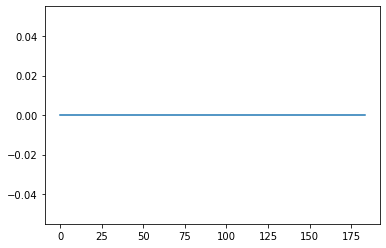

In [34]:
plt.plot(M.isel(trials=0).values)

In [36]:
A = A*(A>0.6)

In [93]:
times = A.time.values
for band in range(len(net.bands)):
    for time in range(len(times)):
        plt.figure(figsize=(12,10))
        plt.subplot2grid((4,3), (0,0), rowspan=3, colspan=3)
        A.isel(trials=0,time=time).plot.imshow(x="roi_1",y="roi_2",cmap='viridis', vmin=0, vmax=1)
        plt.subplot2grid((4,3), (3,0), rowspan=1, colspan=3)
        plt.plot(M.time[:time], M.isel(trials=0, time=slice(0,time)))
        plt.ylim([M.isel(trials=0).min(),M.isel(trials=0).max()])
        plt.savefig(f'img/{time}.png', dpi=150)
        plt.close()

In [37]:
compute_nodes_clustering(A, is_weighted=True, verbose=False)

<xarray.DataArray (roi: 49, trials: 1, time: 184)>
array([[[0.65475147, 0.6535201 , 0.62628847, ..., 0.64172141,
         0.69225631, 0.68717382]],

       [[0.72417033, 0.68970088, 0.64746756, ..., 0.60994931,
         0.6244493 , 0.67396792]],

       [[0.72858717, 0.69082905, 0.65455702, ..., 0.64765902,
         0.71274759, 0.69810218]],

       ...,

       [[0.58136301, 0.55106211, 0.53282425, ..., 0.55000593,
         0.56542321, 0.6253879 ]],

       [[0.60279291, 0.56795257, 0.51980511, ..., 0.31350117,
         0.32532239, 0.4209822 ]],

       [[0.59411788, 0.54982101, 0.52553497, ..., 0.53587526,
         0.58938012, 0.63625784]]])
Coordinates:
  * roi      (roi) uint8 1 4 9 13 16 17 22 23 ... 210 219 221 224 242 248 250
  * time     (time) float64 -0.2 -0.185 -0.17 -0.155 ... 2.5 2.515 2.53 2.545
  * trials   (trials) int64 1